# Run Dreambooth fine-tuned models for Stable Diffusion using d🧨ffusers 

This notebook allows you to run Stable Diffusion concepts trained via Dreambooth using 🤗 Hugging Face [🧨 Diffusers library](https://github.com/huggingface/diffusers). 

Train your own using [here](#) and navigate the [public library concepts](#) to pick yours. You may also want to use the [Spaces](#) to browse the library


![Dreambooth Example](https://dreambooth.github.io/DreamBooth_files/teaser_static.jpg)
_By using just 3-5 images you can teach new concepts to Stable Diffusion and personalize the model on your own images_ 

Differently from Textual Inversion, this approach trains the whole model, which can yield better results to the cost of bigger models.



In [ ]:
#@title Install and import requirements
!pip install -qqq diffusers==0.10.2 transformers gradio ftfy accelerate

import diffusers
import gradio
from PIL import Image
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [10]:
#@title Login to the Hugging Face Hub
#@markdown Optional step, do it if you want to run private concepts
from huggingface_hub import notebook_login
!git config --global credential.helper store

notebook_login()

Token is valid.
Your token has been saved in your configured git credential helpers (store).
Your token has been saved to /root/.huggingface/token
Login successful


In [11]:
#@title Load the model from the [Concepts Library](https://huggingface.co/sd-dreambooth-library). If you are new to Stable Diffusion, make sure you [read the LICENSE](https://github.com/CompVis/stable-diffusion/blob/main/LICENSE)
#@markdown  You may also use a locally trained model by replacing the `model_id` to a path with the model locally or on Google Drive
from torch import autocast
from diffusers import StableDiffusionPipeline
import torch

# model_id = "sd-dreambooth-library/cat-toy" #@param {type:"string"}
model_id = 'harryb0905/harry-dreambooth'
pipe = StableDiffusionPipeline.from_pretrained(model_id, use_auth_token=True, torch_dtype=torch.float16).to("cuda")

Downloading:   0%|          | 0.00/542 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Downloading:   0%|          | 0.00/342 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/317 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/706 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/492M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/525k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/472 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/910 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.05k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/698 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/335M [00:00<?, ?B/s]

In [12]:
#@title Run the Stable Diffusion pipeline with interactive UI Demo on Gradio
#@markdown Run this cell to get a Gradio UI like this to run your models

#@markdown ![](https://i.imgur.com/bxHfawQ.png)
import gradio as gr

def inference(prompt, num_samples):
    all_images = [] 
    images = pipe(prompt, num_images_per_prompt=num_samples, num_inference_steps=50, guidance_scale=7.5).images
    all_images.extend(images)
    return all_images

with gr.Blocks() as demo:
    gr.HTML("<h2 style=\"font-size: 2em; font-weight: bold\" align=\"center\">Stable Diffusion Dreambooth - Run Concept</h2>")
    with gr.Row():
        with gr.Column():
            prompt = gr.Textbox(label="prompt")
            samples = gr.Slider(label="Samples",value=1)
            run = gr.Button(value="Run")
        with gr.Column():
            gallery = gr.Gallery(show_label=False)

    run.click(inference, inputs=[prompt,samples], outputs=gallery)
    gr.Examples([["a photo of sks toy riding a bicycle", 1,1]], [prompt,samples], gallery, inference, cache_examples=False)


demo.launch(debug=True)

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Note: opening Chrome Inspector may crash demo inside Colab notebooks.

To create a public link, set `share=True` in `launch()`.


<IPython.core.display.Javascript object>

Keyboard interruption in main thread... closing server.


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

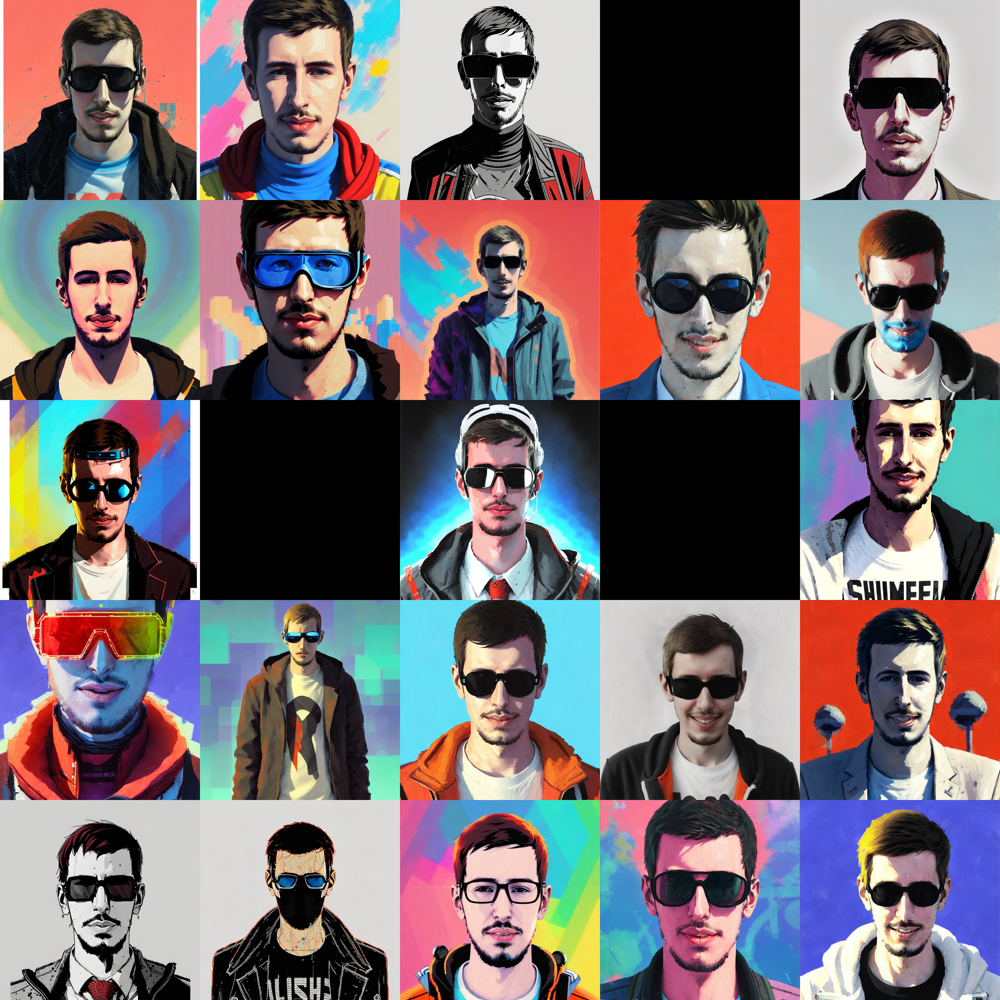

In [39]:
#@title Run the Stable Diffusion pipeline on Colab
#@markdown Don't forget to use the `sks` token in your prompt

from torch import autocast
prompt = "a beautiful portrait painting of a cyberpunk gorblemcworble by pascal blanche and sachin teng and sam yang and greg rutkowski, in style of colorful comic. curious, symmetry, hyper detailed. octanev render. trending on artstation" #@param {type:"string"}

num_samples = 5 #@param {type:"number"}
num_rows = 5 #@param {type:"number"}

all_images = [] 
for _ in range(num_rows):
    images = pipe(prompt, num_images_per_prompt=num_samples, num_inference_steps=50, guidance_scale=7.5).images
    all_images.extend(images)

grid = image_grid(all_images, num_samples, num_rows)
grid